# DonorsChoose : Application Screening

## Description
<p> Source : https://www.kaggle.com/c/donorschoose-application-screening </p>
<p> Download train.zip and resources.zip from Kaggle.</p> 

### Problem statement :
<p> Predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved or not </p>

## Performance Metric

Source: https://www.kaggle.com/c/donorschoose-application-screening/overview/evaluation

Metric(s):

    Area Under Curve (AOC)
    Confusion Matrix

In [2]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import roc_curve, confusion_matrix

from nltk.corpus import stopwords
from tqdm import tqdm

import nltk
import string
import re
import os
import pickle
from collections import Counter

## 1.1 Reading Data

In [0]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [4]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [5]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [0]:
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039
# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

catogories = list(project_data['project_subject_categories'].values)
cat_list = []
for i in catogories:
    temp = ""
    for j in i.split(','): 
        if 'The' in j.split(): 
            j=j.replace('The','') 
        j = j.replace(' ','') 
        temp+=j.strip()+" " 
        temp = temp.replace('&','_')
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 preprocessing of `project_subject_subcategories`

In [0]:
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039
# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_catogories = list(project_data['project_subject_subcategories'].values)

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    for j in i.split(','):
        if 'The' in j.split():
            j=j.replace('The','')
        j = j.replace(' ','')
        temp +=j.strip()+" "
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [9]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [17]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 109248/109248 [01:06<00:00, 1644.60it/s]


In [18]:
# after preprocesing
preprocessed_essays[20000]

'my kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism they eager beavers always strive work hardest working past limitations the materials ones i seek students i teach title i school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore have ever felt like ants pants needed groove move meeting this kids feel time the want able move learn say wobble chairs answer i love develop core enhances gross motor turn fine motor skills they also want learn games kids not want sit worksheets they want learn count jumping playing physical engagement key success the number toss color shape mats make happen my students forget work fun 6 year old deserves nannan'

In [19]:
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_titles.append(sent.lower().strip())
preprocessed_titles[5438]

100%|██████████| 109248/109248 [00:03<00:00, 33885.83it/s]


'mac imize steam'

## 1.5 Preparing data for models

In [18]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

In [0]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

<h1>2. Clustering </h1>

<h2>2.1 Choose the best data matrix on which you got the best AUC</h2>

In [21]:
#importing required libraries
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from scipy.sparse import hstack
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from wordcloud import WordCloud
from prettytable import PrettyTable

#creating input and output parts
X = project_data[:].drop('project_is_approved', axis = 1)
Y = project_data[:]['project_is_approved']

#replacing essay and title column with preprocessed texts as it is needed in bow, tfidf,.. encoding
X['essay'] = preprocessed_essays[:]
X['project_title'] = preprocessed_titles[:]

X_tr = X
print("Shape of data matrix is : ",X_tr.shape)

Shape of data matrix is :  (109248, 19)


<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

In [22]:
#Encoding project_categories for all sets
vectorizer = CountVectorizer(lowercase=False, binary=True)
categories_tr = vectorizer.fit_transform(X_tr['clean_categories'].values)

print("Shape of matrix after one hot encoding ",categories_tr.shape)

Shape of matrix after one hot encoding  (109248, 9)


In [23]:
#Encoding project_subcategories for all sets
vectorizer = CountVectorizer(lowercase=False, binary=True)
subcategories_tr = vectorizer.fit_transform(X_tr['clean_subcategories'].values)

print("Shape of matrix after one hot encoding ",subcategories_tr.shape)

Shape of matrix after one hot encoding  (109248, 30)


In [24]:
#Encoding school_state for all sets
vectorizer = CountVectorizer(lowercase=False, binary=True)
school_state_tr = vectorizer.fit_transform(X_tr['school_state'].values)

print("Shape of matrix after one hot encoding ",school_state_tr.shape)

Shape of matrix after one hot encoding  (109248, 51)


In [25]:
#Encoding teacher_prefix for all sets
vectorizer = CountVectorizer(lowercase=False, binary=True)
teacher_prefix_tr = vectorizer.fit_transform(map(str,X_tr['teacher_prefix'].values))

print("Shape of matrix after one hot encoding ",teacher_prefix_tr.shape)

Shape of matrix after one hot encoding  (109248, 6)


In [26]:
#Encoding project_grade_category for all sets
vectorizer = CountVectorizer(lowercase=False, binary=True)
project_grade_category_tr = vectorizer.fit_transform(X_tr['project_grade_category'].values)

print("Shape of matrix after one hot encoding ",project_grade_category_tr.shape)

Shape of matrix after one hot encoding  (109248, 3)


### 2.2.2 Encoding Numerical Features

In [0]:
#Standarizing for all sets, try printing their shape to test if code is correct or not
scalar = StandardScaler()
price_tr = scalar.fit_transform(X_tr['price'].values.reshape(-1, 1))

In [0]:
#Standarizing for all sets, try printing their shape to test if code is correct or not
scalar = StandardScaler()
tnopp_tr = scalar.fit_transform(X_tr['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

### 2.3.1 Encoding using bow

In [29]:
#Encoding essay for each data set using bow
vectorizer = CountVectorizer(min_df=10)
e_bow_tr = vectorizer.fit_transform(X_tr['essay'])

print("Shape of matrix after bow encoding ",e_bow_tr.shape)

Shape of matrix after bow encoding  (109248, 16623)


In [30]:
#Encoding title for each data set using bow
vectorizer = CountVectorizer(min_df=10)
t_bow_tr = vectorizer.fit_transform(X_tr['project_title'])

print("Shape of matrix after bow encoding ",t_bow_tr.shape)

Shape of matrix after bow encoding  (109248, 3329)


<h2>2.4 Dimensionality Reduction on the selected features </h2>

In [31]:
Xtr = hstack((school_state_tr,categories_tr, subcategories_tr, teacher_prefix_tr, project_grade_category_tr, e_bow_tr, t_bow_tr, price_tr, tnopp_tr)).tocsr()   
print("Shape of data matrix is before kbest is: ",Xtr.shape)

model = SelectKBest(f_classif, k=5000)
Xtr = model.fit_transform(Xtr, Y)
print("Shape of data matrix is after kbest is: ",Xtr.shape)

Shape of data matrix is before kbest is:  (109248, 20053)
Shape of data matrix is after kbest is:  (109248, 5000)


### Functions for specified task

In [0]:
def total_points_in_cluster(labels, param):
    labels_in_cluster = [[] for i in range(param)]                         #this is a list of list
    for i in range(len(labels)):
        labels_in_cluster[labels[i]].append(Y[0:10000][i])

    uni, no_of_points = np.unique(labels, return_counts = True)               #calculating number of points in each cluster

    for i in range(param):
        unique, counts = np.unique(labels_in_cluster[i], return_counts=True)
        if(len(unique) == 1):
            print('Cluster',i,'contains',no_of_points[i],'points of which', counts[0],'(i.e.',np.round(counts[0]*100/no_of_points[i]),'%)points are of label', unique[0])    
        else:
            print('Cluster',i,'contains',no_of_points[i],'points of which', counts[0],'(i.e.',np.round(counts[0]*100/no_of_points[i]),'%)points are of label', unique[0],'and', counts[1],'(i.e.',np.round(counts[1]*100/no_of_points[i]),'%)points are of label',unique[1])

In [0]:
def print_essays(no_of_clusters, labels, essay):
#printing 3 essays for each cluster
    unique, counts = np.unique(labels, return_counts=True)
    for i in range(no_of_clusters):
        j = 0
        if counts[i] > 3:                                    
            count = 0
        else:
            count = 3 - counts[i]                            #if a cluster has less than 3 points.
        print('Printing 3 essays from cluster',i)
        while(1):
            if(labels[j] == i):
                print(count+1, essay[j])                     #printing j'th essay that as it matches with cluster number
                count += 1
            j += 1
            if count == 3:
                print('\n\n')
                break

In [0]:
def get_cluster_data(labels, cluster_number):
    ix = []          #list for storing indices of specified cluster_number

    for i in range(len(labels)):
        if labels[i]==cluster_number:         #calculating false positive points
            ix.append(i)

    #Using the original test data set which was used before one hot encoding and text encoding(bow, tfidf, etc)
    cluster_data = essay[ix]
    return cluster_data

In [0]:
#generating word cloud : https://www.geeksforgeeks.org/generating-word-cloud-python/
def plot_word_cloud(cluster_data, number):
    comment_words = ' '
    for essay in cluster_data:                #loop for combining words from each essay
        tokens = essay.split()                 #split the words 

        for words in tokens: 
            comment_words = comment_words + words + ' '       #combine words from a single essay

    wordcloud = WordCloud(width = 800, height = 800, background_color ='white', min_font_size = 10).generate(comment_words) 
    
    print('Word Cloud for Cluster',number,'is')
    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title('Word Cloud')
    plt.show()

<h2>2.5 Apply Kmeans</h2>

### 2.5.1 Finding the best hyperparameter for kmeans

For 1 clusters inertia value is 1633382.1684621167
For 3 clusters inertia value is 1534899.4961504473
For 5 clusters inertia value is 1501350.2238854342
For 7 clusters inertia value is 1481091.8667581775
For 9 clusters inertia value is 1467652.761059263
For 11 clusters inertia value is 1455255.7677713803
For 13 clusters inertia value is 1444484.6446420238
For 15 clusters inertia value is 1433811.594231164
For 17 clusters inertia value is 1427131.1591834805
For 19 clusters inertia value is 1420424.281128198
For 21 clusters inertia value is 1405782.8626502007


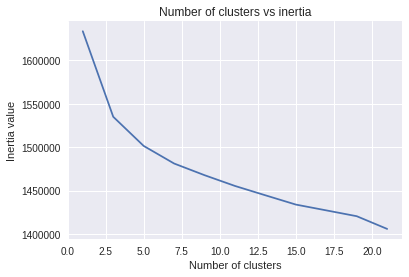

In [36]:
k_clusters = [i for i in range(1,22,2)]
inertia = []
for k in k_clusters:
    model = KMeans(n_clusters = k, random_state = 0)
    model.fit(Xtr[0:10000])
    print('For',k,'clusters inertia value is',model.inertia_)
    inertia.append(model.inertia_) 

plt.plot(k_clusters,inertia)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia value')
plt.title('Number of clusters vs inertia')
plt.show()

### 2.5.2 Clustering using best best hyperparameter

In [69]:
#looking at the graph the best k is 5 as slope of graph decreases after 5
param_k = 5
print('The best ‘k’ using the elbow-knee method is',param_k)

#Clustering using best k
model = KMeans(n_clusters = param_k, random_state = 0)
model.fit(Xtr[0:10000])

The best ‘k’ using the elbow-knee method is 5


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

### 2.5.3 Manually Reviewing Clusters

In [70]:
#print total points in each cluster
essay = np.array(X[0:10000]['essay'])
total_points_in_cluster(model.labels_, param_k)

Cluster 0 contains 959 points of which 88 (i.e. 9.0 %)points are of label 0 and 871 (i.e. 91.0 %)points are of label 1
Cluster 1 contains 2780 points of which 504 (i.e. 18.0 %)points are of label 0 and 2276 (i.e. 82.0 %)points are of label 1
Cluster 2 contains 1771 points of which 283 (i.e. 16.0 %)points are of label 0 and 1488 (i.e. 84.0 %)points are of label 1
Cluster 3 contains 1454 points of which 168 (i.e. 12.0 %)points are of label 0 and 1286 (i.e. 88.0 %)points are of label 1
Cluster 4 contains 3036 points of which 457 (i.e. 15.0 %)points are of label 0 and 2579 (i.e. 85.0 %)points are of label 1


As we can see each cluster contins points of both lablels. As there are only 15% points of class 0 in whole dataset, they amount of points in each cluster are also close to 15%. This shows that the algorithm is unable to clusters which will have almost all points of a single class.

In [0]:
#printing 3 essays for each cluster
print_essays(param_k, model.labels_, essay)

Printing 3 essays from cluster 0
1 over 95 students free reduced lunch i homeless despite come school eagerness learn my students inquisitive eager learners embrace challenge not great books resources every day many not afforded opportunity engage big colorful pages book regular basis home not travel public library it duty teacher i provide student opportunity succeed every aspect life reading fundamental my students read books boosting comprehension skills these books used read alouds partner reading independent reading they engage reading build love reading reading pure enjoyment they introduced new authors well old favorites i want students ready 21st century know pleasure holding good hard back book hand there nothing like good book read my students soar reading consideration generous funding contribution this help build stamina prepare 3rd grade thank much reading proposal nannan
2 there many little ways enlarge world love books best jacqueline kennedy i work title 1 school serves

### 2.5.4 Plotting word cloud for each cluster

Total points in Cluster 0 are 959
Word Cloud for Cluster 0 is


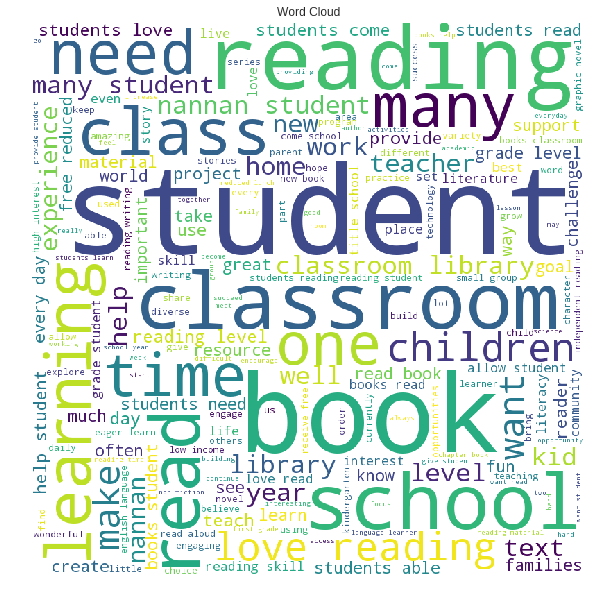

Total points in Cluster 1 are 2780
Word Cloud for Cluster 1 is


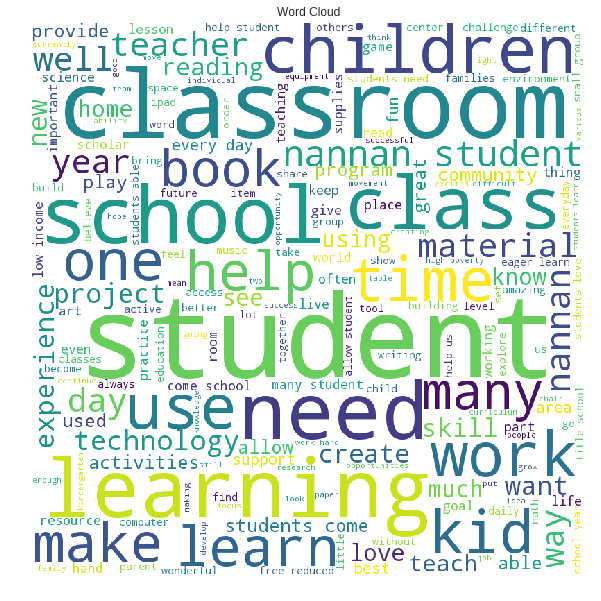

Total points in Cluster 2 are 1771
Word Cloud for Cluster 2 is


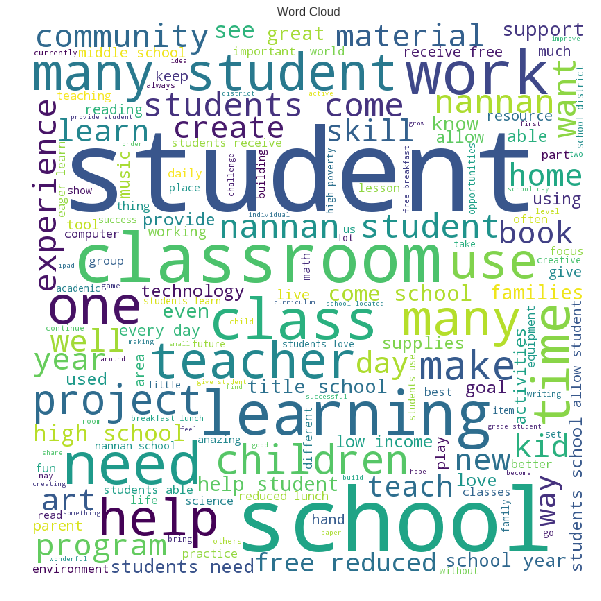

Total points in Cluster 3 are 1454
Word Cloud for Cluster 3 is


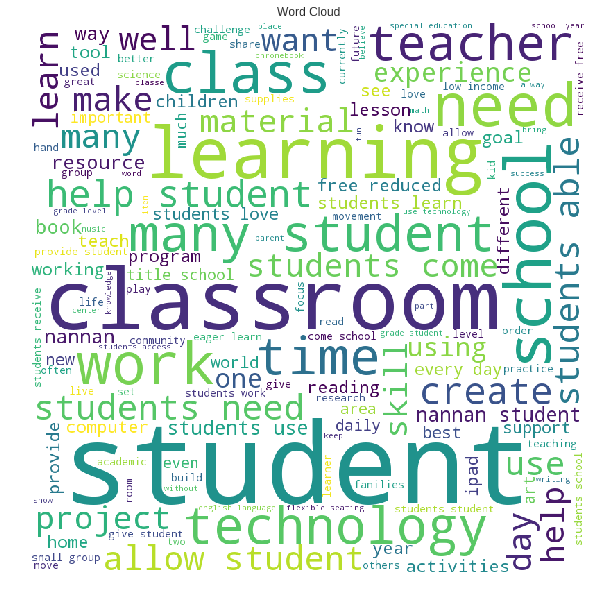

Total points in Cluster 4 are 3036
Word Cloud for Cluster 4 is


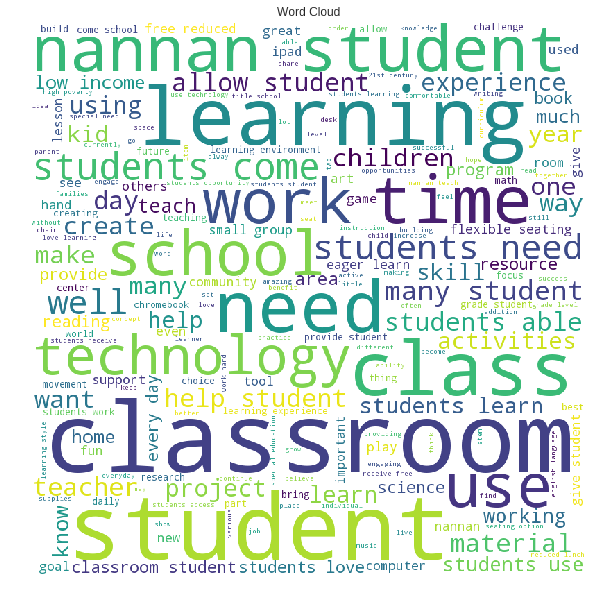

In [0]:
for i in range(param_k):
    cluster_data = get_cluster_data(model.labels_, i)
    print('Total points in Cluster',i,'are',len(cluster_data))
    plot_word_cloud(cluster_data,i)

<h2>2.6 Apply Agglomerative Clustering</h2>

### 2.6.1 Clustering using 2 clusters

In [65]:
param_agg = 2
model = AgglomerativeClustering(n_clusters = param_agg)
model.fit(Xtr[0:10000].toarray())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=2,
            pooling_func='deprecated')

### 2.6.2 Manually Reviewing Clusters

In [68]:
#print total points in each cluster
essay = np.array(X[0:10000]['essay'])
total_points_in_cluster(model.labels_, param_agg)

Cluster 0 contains 8762 points of which 1360 (i.e. 16.0 %)points are of label 0 and 7402 (i.e. 84.0 %)points are of label 1
Cluster 1 contains 1238 points of which 140 (i.e. 11.0 %)points are of label 0 and 1098 (i.e. 89.0 %)points are of label 1


As we can see each cluster contins points of both lablels. As there are only 15% points of class 0 in whole dataset, they amount of points in each cluster are also close to 15%. This shows that the algorithm is unable to clusters which will have almost all points of a single class.

In [0]:
#printing 3 essays for each cluster
print_essays(param_agg, model.labels_, essay)

Printing 3 essays from cluster 0
1 my students english learners working english second third languages we melting pot refugees immigrants native born americans bringing gift language school we 24 languages represented english learner program students every level mastery we also 40 countries represented families within school each student brings wealth knowledge experiences us open eyes new cultures beliefs respect the limits language limits world ludwig wittgenstein our english learner strong support system home begs resources many times parents learning read speak english along side children sometimes creates barriers parents able help child learn phonetics letter recognition reading skills by providing dvd players students able continue mastery english language even no one home able assist all families students within level 1 proficiency status offered part program these educational videos specially chosen english learner teacher sent home regularly watch the videos help child develo

### 2.6.3 Plotting Word Cloud for each Cluster

Total points in Cluster 0 are 8762
Word Cloud for Cluster 0 is


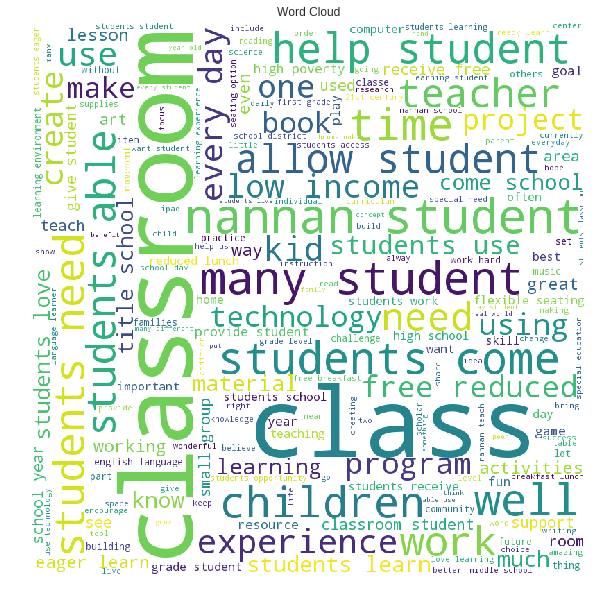

Total points in Cluster 1 are 1238
Word Cloud for Cluster 1 is


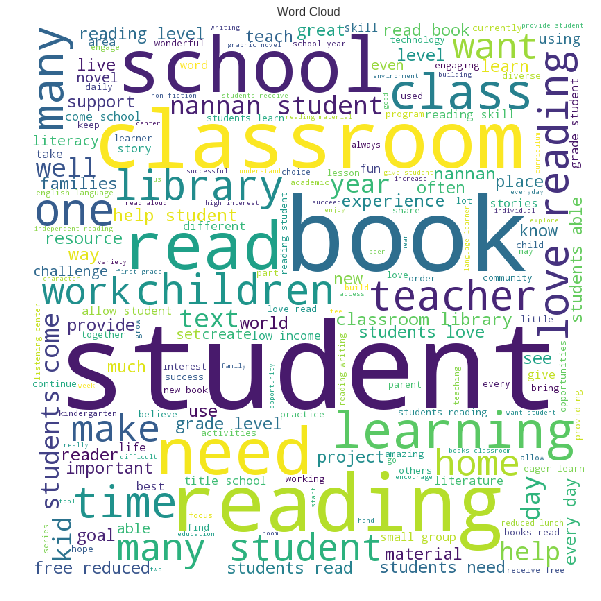

In [0]:
for i in range(param_agg):
    cluster_data = get_cluster_data(model.labels_, i)
    print('Total points in Cluster',i,'are',len(cluster_data))
    plot_word_cloud(cluster_data,i)

### 2.6.4 Clustering using 5 clusters

In [71]:
param_agg = 5
model = AgglomerativeClustering(n_clusters = param_agg)
model.fit(Xtr[0:10000].toarray())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=5,
            pooling_func='deprecated')

### 2.6.5 Manually Reviewing Clusters

In [72]:
#print total points in each cluster
essay = np.array(X[0:10000]['essay'])
total_points_in_cluster(model.labels_, param_agg)

Cluster 0 contains 1558 points of which 186 (i.e. 12.0 %)points are of label 0 and 1372 (i.e. 88.0 %)points are of label 1
Cluster 1 contains 1455 points of which 264 (i.e. 18.0 %)points are of label 0 and 1191 (i.e. 82.0 %)points are of label 1
Cluster 2 contains 3778 points of which 611 (i.e. 16.0 %)points are of label 0 and 3167 (i.e. 84.0 %)points are of label 1
Cluster 3 contains 1238 points of which 140 (i.e. 11.0 %)points are of label 0 and 1098 (i.e. 89.0 %)points are of label 1
Cluster 4 contains 1971 points of which 299 (i.e. 15.0 %)points are of label 0 and 1672 (i.e. 85.0 %)points are of label 1


As we can see each cluster contins points of both lablels. As there are only 15% points of class 0 in whole dataset, they amount of points in each cluster are also close to 15%. This shows that the algorithm is unable to clusters which will have almost all points of a single class.

In [0]:
#printing 3 essays for each cluster
print_essays(param_agg, model.labels_, essay)

Printing 3 essays from cluster 0
1 i moving 2nd grade 3rd grade beginning next school year i takings current students move i teach inclusion classroom includes students adhd sld well autistic students my students work hard achieving goals no matter struggles may the school i teach houses great deal autistic students well ell students my student love read work challenge they also love move around they work better able move room different areas rather usual set these flexible seating options allow students different seating options instead sitting traditional desk chair able use flexible seating tools reduce stress anxiety these tools beneficial students special needs also students it proven fact students moving oxygen going brain means learning taking place these flexible seating options allow students move traditional seat allows reduce stress classroom this project significantly help students reduce stress anxiety standardized testing the students 3rd grade required take state mandate

### 2.6.6 Plotting Word Cloud for each Cluster

Total points in Cluster 0 are 1558
Word Cloud for Cluster 0 is


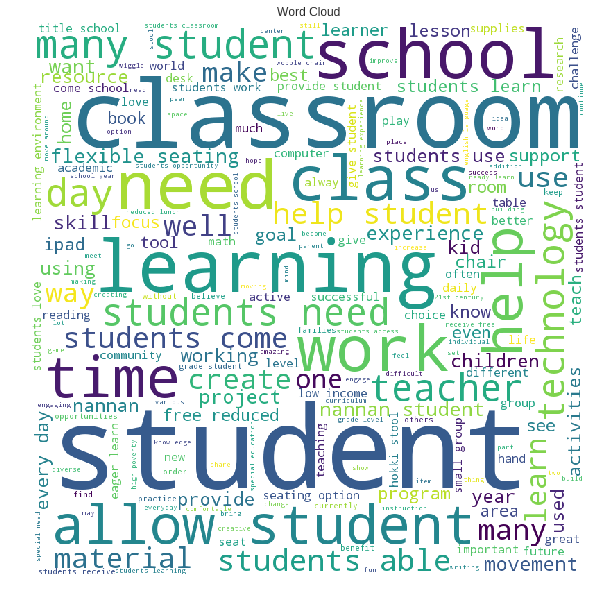

Total points in Cluster 1 are 1455
Word Cloud for Cluster 1 is


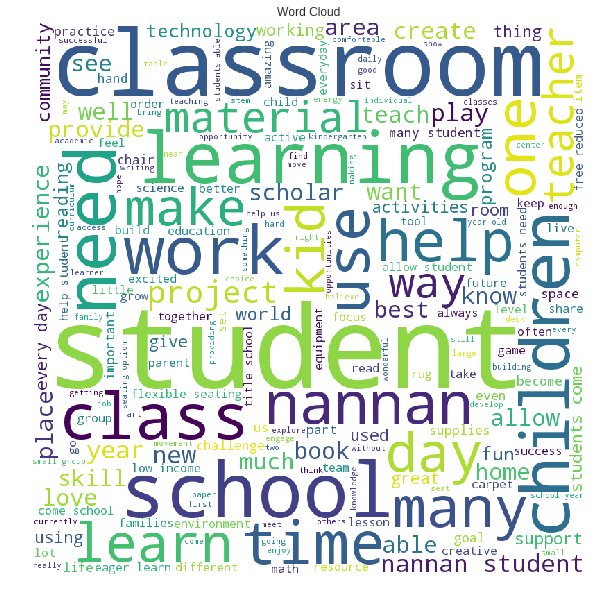

Total points in Cluster 2 are 3778
Word Cloud for Cluster 2 is


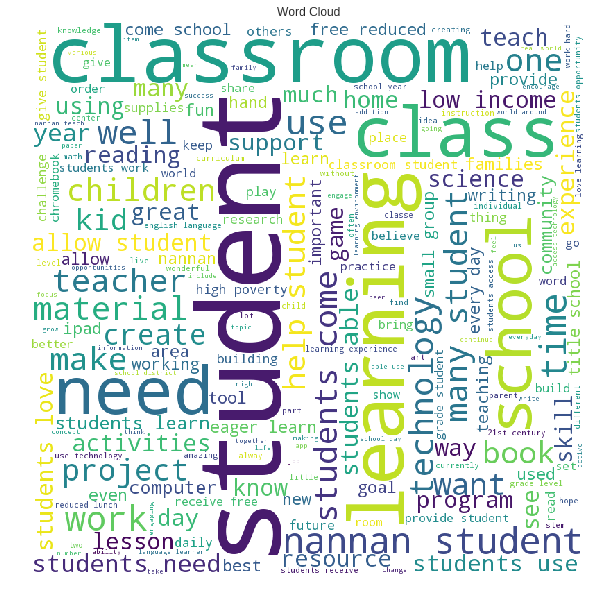

Total points in Cluster 3 are 1238
Word Cloud for Cluster 3 is


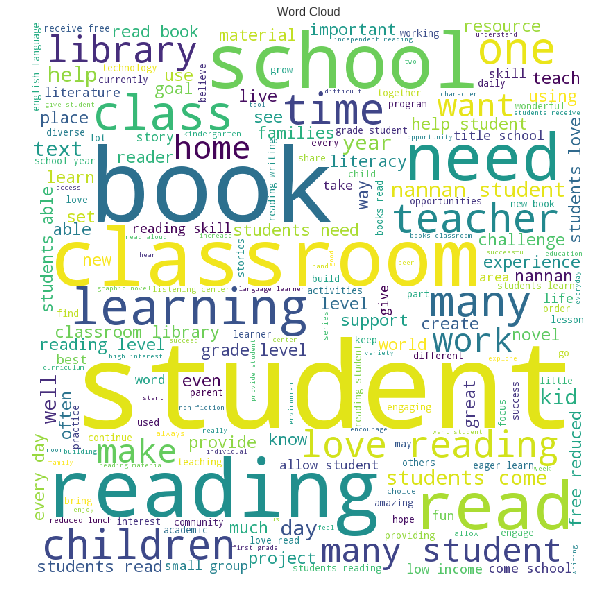

Total points in Cluster 4 are 1971
Word Cloud for Cluster 4 is


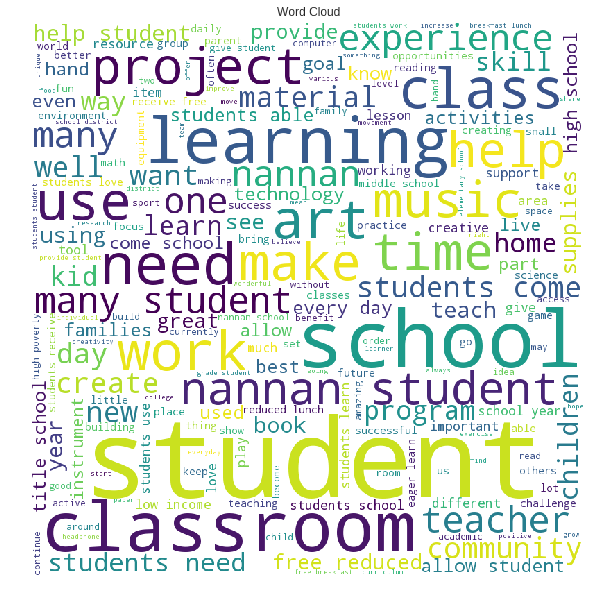

In [0]:
for i in range(param_agg):
    cluster_data = get_cluster_data(model.labels_, i)
    print('Total points in Cluster',i,'are',len(cluster_data))
    plot_word_cloud(cluster_data,i)

### 2.6.7 Clustering using 8 clusters

In [37]:
param_agg = 8
model = AgglomerativeClustering(n_clusters = param_agg)
model.fit(Xtr[0:10000].toarray())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=8,
            pooling_func='deprecated')

### 2.6.8 Manually Reviewing Clusters

In [43]:
#print total points in each cluster
essay = np.array(X[0:10000]['essay'])
total_points_in_cluster(model.labels_, param_agg)

Cluster 0 contains 1971 points of which 299 (i.e. 15.0 %)points are of label 0 and 1672 (i.e. 85.0 %)points are of label 1
Cluster 1 contains 1238 points of which 140 (i.e. 11.0 %)points are of label 0 and 1098 (i.e. 89.0 %)points are of label 1
Cluster 2 contains 1454 points of which 263 (i.e. 18.0 %)points are of label 0 and 1191 (i.e. 82.0 %)points are of label 1
Cluster 3 contains 3089 points of which 533 (i.e. 17.0 %)points are of label 0 and 2556 (i.e. 83.0 %)points are of label 1
Cluster 4 contains 725 points of which 83 (i.e. 11.0 %)points are of label 0 and 642 (i.e. 89.0 %)points are of label 1
Cluster 5 contains 833 points of which 103 (i.e. 12.0 %)points are of label 0 and 730 (i.e. 88.0 %)points are of label 1
Cluster 6 contains 1 points of which 1 (i.e. 100.0 %)points are of label 0
Cluster 7 contains 689 points of which 78 (i.e. 11.0 %)points are of label 0 and 611 (i.e. 89.0 %)points are of label 1


As we can see each cluster contins points of both lablels. As there are only 15% points of class 0 in whole dataset, they amount of points in each cluster are also close to 15%. This shows that the algorithm is unable to clusters which will have almost all points of a single class.

In [0]:
#printing 3 essays for each cluster
print_essays(param_agg, model.labels_, essay)

Printing 3 essays from cluster 0
1 true champions not always ones win guts by mia hamm this quote best describes students cholla middle school approach playing sports especially girls boys soccer teams the teams made 7th 8th grade students not opportunity play organized sport due family financial difficulties i teach title one middle school urban neighborhood 74 students qualify free reduced lunch many come activity sport opportunity poor homes my students love participate sports learn new skills apart team atmosphere my school lacks funding meet students needs i concerned lack exposure not prepare participating sports teams high school by end school year goal provide students opportunity learn variety soccer skills positive qualities person actively participates team the students campus come school knowing face uphill battle comes participating organized sports the players would thrive field confidence appropriate soccer equipment play soccer best abilities the students experience hel

### 2.6.9 Plotting Word Cloud for each Cluster

Total points in Cluster 0 are 1971
Word Cloud for Cluster 0 is


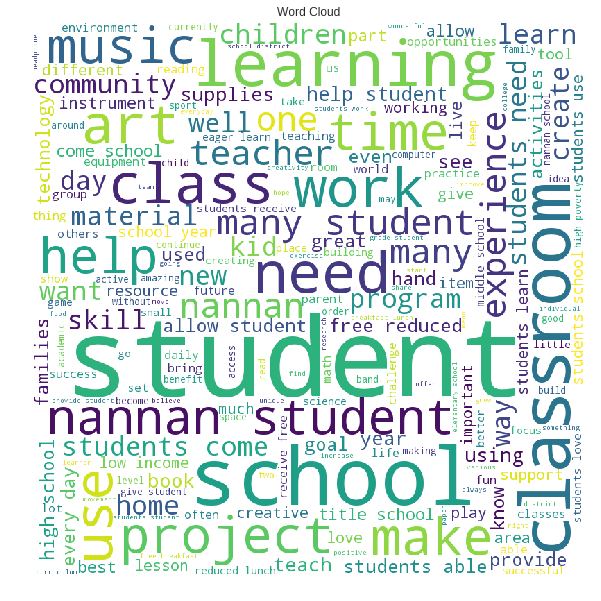

Total points in Cluster 1 are 1238
Word Cloud for Cluster 1 is


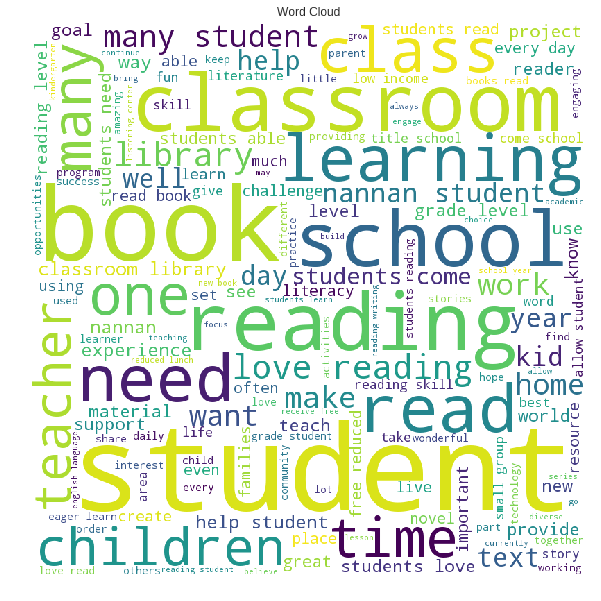

Total points in Cluster 2 are 1454
Word Cloud for Cluster 2 is


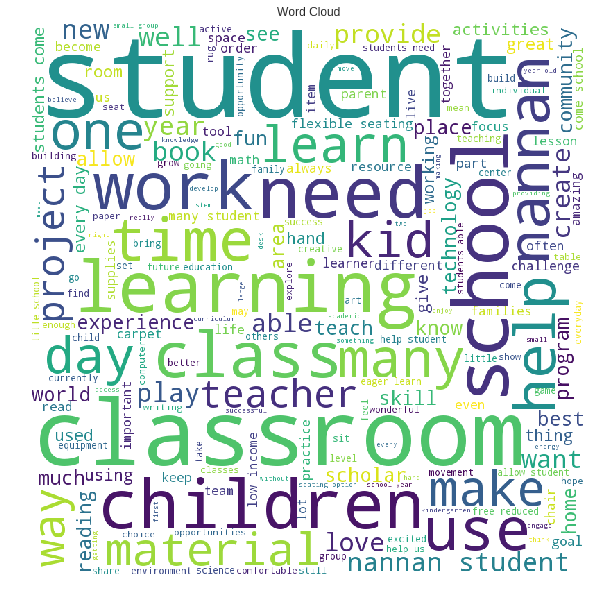

Total points in Cluster 3 are 3089
Word Cloud for Cluster 3 is


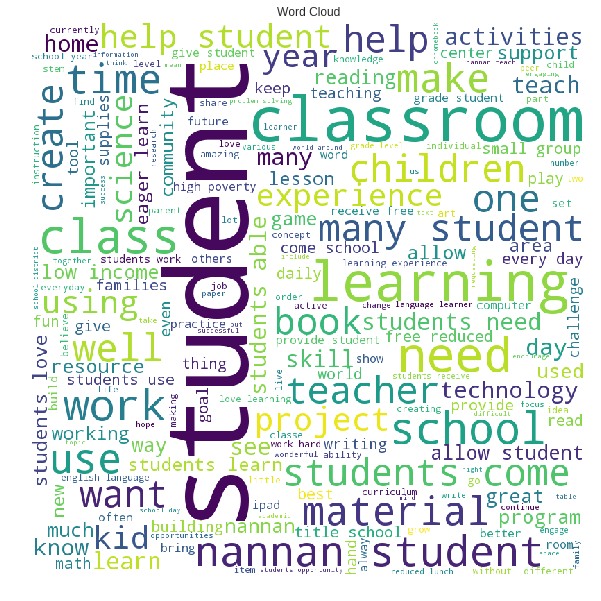

Total points in Cluster 4 are 725
Word Cloud for Cluster 4 is


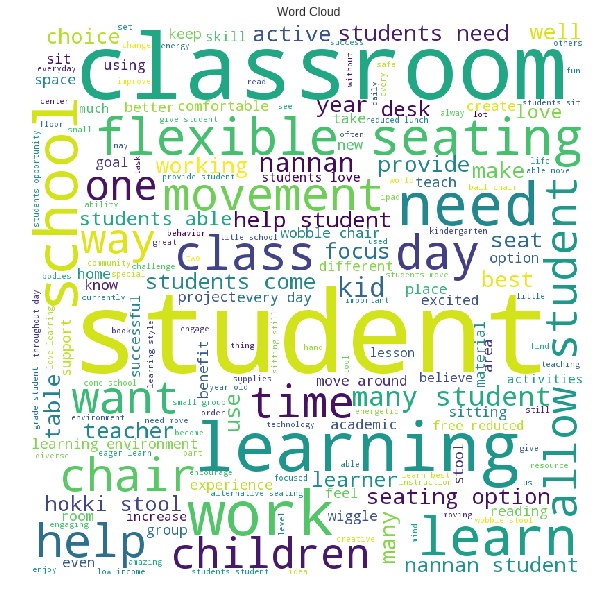

Total points in Cluster 5 are 833
Word Cloud for Cluster 5 is


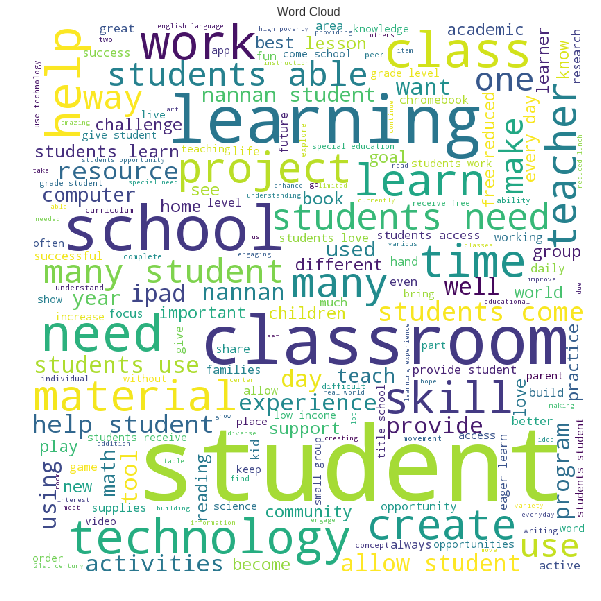

Total points in Cluster 6 are 1
Word Cloud for Cluster 6 is


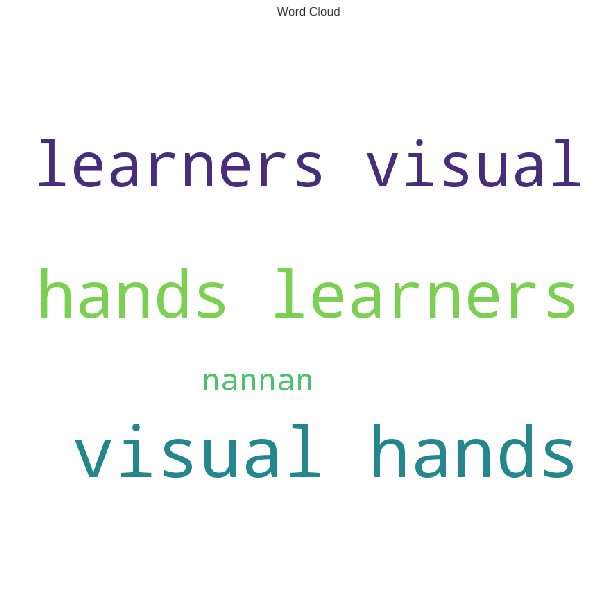

Total points in Cluster 7 are 689
Word Cloud for Cluster 7 is


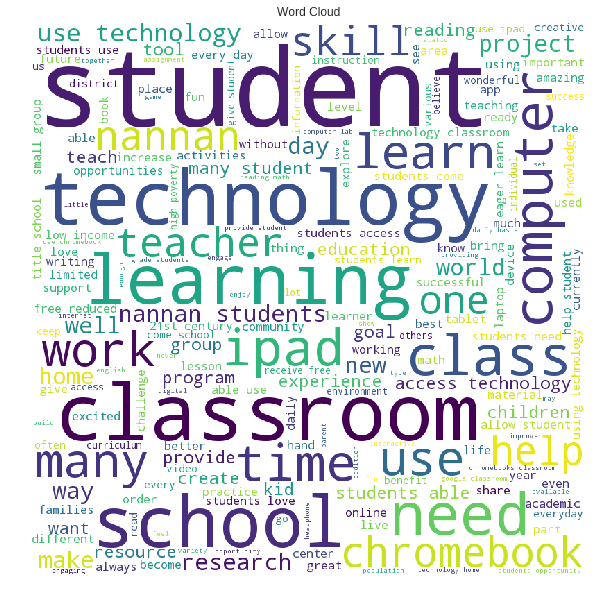

In [0]:
for i in range(param_agg):
    cluster_data = get_cluster_data(model.labels_, i)
    print('Total points in Cluster',i,'are',len(cluster_data))
    plot_word_cloud(cluster_data,i)

<h2>2.7 Apply DBSCAN</h2>

### 2.7.1 Finding the best value of epsilon

In [0]:
data = Xtr[0:10000]
n = data.shape[0]
d = data.shape[1]
min_points = d + 1


data = data.toarray()
distances = []
for xi in data:
    dists_of_xi = np.sort(np.sum((data-xi)**2,axis=1),axis=None)         #calculating nearest neighbours to each point from the dataset
    distances.append(dists_of_xi[min_points])                            #stroing the min_points distance

sorted_distances = np.sort(np.sqrt(distances))

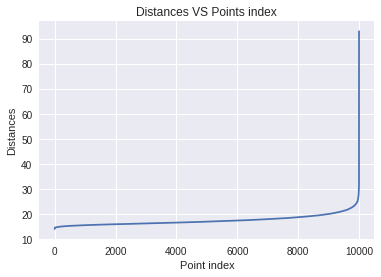

In [0]:
# Draw distances(d_i) VS points(x_i) plot
points = [i for i in range(n)]

plt.plot(points, sorted_distances)
plt.xlabel('Point index')
plt.ylabel('Distances')
plt.title('Distances VS Points index',)
plt.show()

### 2.7.2 Clustering using best epsilon

In [0]:
#best epsilon value is 22
epsilon = 22
model = DBSCAN(eps = epsilon, min_samples = min_points)
model.fit(data)

### 2.7.3 Manually Reviewing Clusters

In [0]:
essay = np.array(X[0:10000]['essay'])
unique, counts = np.unique(model.labels_, return_counts=True)
no_of_clusters = len(unique)
print('Number of unique clusters is',no_of_clusters,'and they are',unique)
print('Total points in each cluster are',counts)

Number of unique clusters is 2 and they are [-1  0]
Total points in each cluster are [   8 9992]


In [0]:
#print(model.labels_)
new_cluster_number = max(model.labels_) + 1                       #changing -1 cluster labels to max of cluster label + 1
for i in range(len(model.labels_)):
    if(model.labels_[i] == -1):
        model.labels_[i] = new_cluster_number
       
unique, counts = np.unique(model.labels_, return_counts = True)
print('After changing -1 to new cluster number, unique clusters are',unique,'and total points in each cluster are',counts)

After changing -1 to new cluster number, unique clusters are [0 1] and total points in each cluster are [9992    8]


In [0]:
print_essays(no_of_clusters, model.labels_, essay)

Printing 3 essays from cluster 0
1 my students english learners working english second third languages we melting pot refugees immigrants native born americans bringing gift language school we 24 languages represented english learner program students every level mastery we also 40 countries represented families within school each student brings wealth knowledge experiences us open eyes new cultures beliefs respect the limits language limits world ludwig wittgenstein our english learner strong support system home begs resources many times parents learning read speak english along side children sometimes creates barriers parents able help child learn phonetics letter recognition reading skills by providing dvd players students able continue mastery english language even no one home able assist all families students within level 1 proficiency status offered part program these educational videos specially chosen english learner teacher sent home regularly watch the videos help child develo

### 2.7.4 Plotting Word Cloud for each Cluster

Total points in Cluster 0 are 9992
Word Cloud for Cluster 0 is


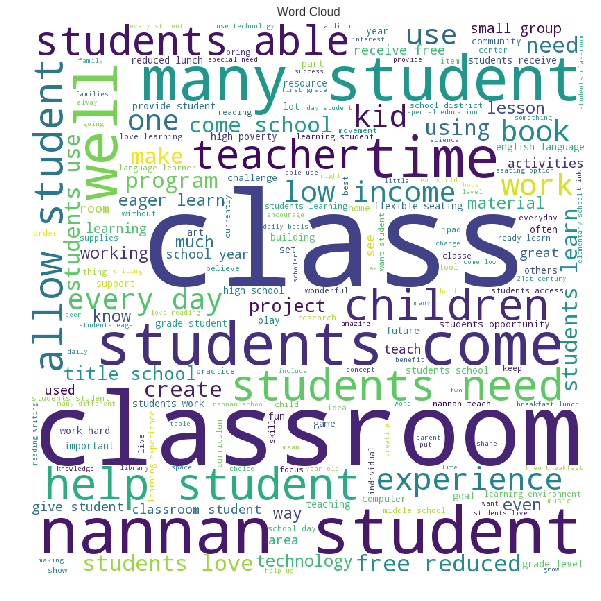

Total points in Cluster 1 are 8
Word Cloud for Cluster 1 is


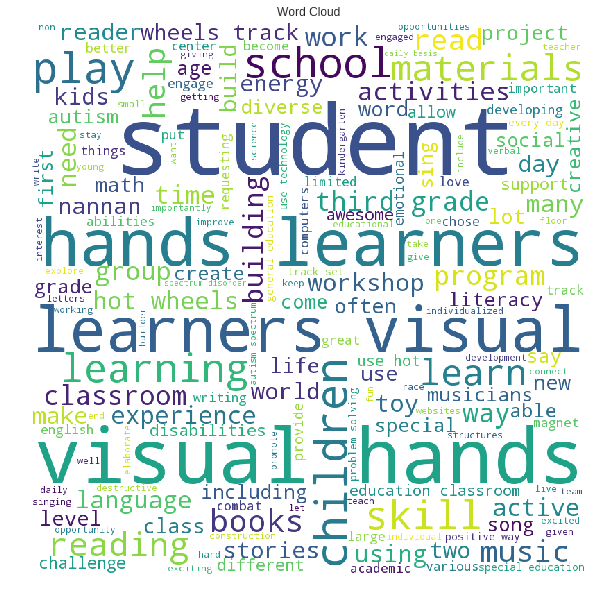

In [0]:
for i in range(no_of_clusters):
    cluster_data = get_cluster_data(model.labels_, i)
    print('Total points in Cluster',i,'are',len(cluster_data))
    plot_word_cloud(cluster_data,i)

<h1>3. Conclusions</h1>
1. Looking at the essays of each cluster and word cloud of each cluster, some words like **student**, **learning**, **classroom**, **school**, **help**, **need**  are present in all clusters in a huge amount . Hence this makes the classification objective of project is approved or not very difficult.

2. However there are some words like words like **work**, **technology**, **material**, etc which can help in clustering points into different groups. Maybe this can also help in classification.

3. In DBSCAN we can see that only 8 points are outliners and almost all points are in one group, meaning finding a decision surface for classification is difficult

4. The points which are outliners in DBSCAN contain some words like, **visual**, **hands**, **learners**. These same word are also present in cluster 6 of Agglomerative Clustering which contains only 1 point. Hence they are outliners 